<a href="https://colab.research.google.com/github/MiguelUrenaPliego/labTopoSAM/blob/main/segment_anything_por_puntos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"
from google.colab import output
output.enable_custom_widget_manager()

In [ ]:
%pip install segment-geospatial groundingdino-py leafmap localtileserver geopandas

In [ ]:
import os
import geopandas
import leafmap
from samgeo import tms_to_geotiff, split_raster
from samgeo.text_sam import LangSAM
from samgeo import SamGeo, show_image, download_file, overlay_images, tms_to_geotiff

Creamos las carpetas vector y raster para guardar los resultados

Creamos el objeto mapa

Siempre que hagamos algo con el objeto m estaremos editando el mapa

In [ ]:
m = leafmap.Map(center=[43.2294769, -7.5824514], zoom=17, height="600px") # center=[lat, lon]
m.add_basemap("SATELLITE")
m.add_basemap("HYBRID")
m

Map(center=[43.2294769, -7.5824514], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title…

Guardamos en bbox los límites de tu selección

In [ ]:
if m.user_roi_bounds() is not None:
    bbox = m.user_roi_bounds()
else:
    bbox = "No has seleccionado nada"
    print("No has seleccionado nada")
    #bbox = [-122.2659, 37.8682, -122.2521, 37.8741]
bbox

[-7.5857, 43.2306, -7.584, 43.2315]

Decargamos las imágenes en formato tif en máxima resolución (zoom = 20)

Valores de zoom de 13 a 17 dan resoluciones menores pero aceptables y el modelo tardará menos en procesar, especialmente para la máscara automática (3).

In [ ]:
image = "satellite.tif"
tms_to_geotiff(output=image, bbox=bbox, zoom=20, source="Satellite", overwrite=True)

Downloaded image 01/25
Downloaded image 02/25
Downloaded image 03/25
Downloaded image 04/25
Downloaded image 05/25
Downloaded image 06/25
Downloaded image 07/25
Downloaded image 08/25
Downloaded image 09/25
Downloaded image 10/25
Downloaded image 11/25
Downloaded image 12/25
Downloaded image 13/25
Downloaded image 14/25
Downloaded image 15/25
Downloaded image 16/25
Downloaded image 17/25
Downloaded image 18/25
Downloaded image 19/25
Downloaded image 20/25
Downloaded image 21/25
Downloaded image 22/25
Downloaded image 23/25
Downloaded image 24/25
Downloaded image 25/25
Saving GeoTIFF. Please wait...
Image saved to satellite.tif


### Opción 2: Cargar imágenes desde archivo local
Puedes cargar tu propia imagen escribiendo la ruta. Debe ser un formato .tif con 3 canales R (rojo) G (verde) B (azul)

In [ ]:
# image = '/path/to/your/own/image.tif'

###Vemos las imágenes cargadas sobre el mapa

In [ ]:
#Borra todo
m.clear_layers()
#Añade mapas básicos
m.add_basemap("SATELLITE")
m.add_basemap("HYBRID")
#Si da error vuelve a ejecutar la celda de nuevo
#m.layers[1].visible = True #Para quitar la imagen satelite online
m.layers[1].visible = False
m.remove_layer('Image')
m.add_raster(image, layer_name="Image")
m

INFO:large_image:Cannot use memcached for caching.
INFO:large_image:Using python for large_image caching


Map(bottom=12300582.0, center=[43.230023735935596, -7.58205777078227], controls=(ZoomControl(options=['positio…

###Opcinal: *separar imágenes grandes en lotes*

#Segmentar a partir de puntos
Seleccionar al menos un punto dentro de cada objeto que quieres segmentar  

(a) Metadatos de SAM

In [ ]:
sam_kwargs = {
    "points_per_side": 32,
    "pred_iou_thresh": 0.86, #precisión para considerar detección en tanto por 1
    "stability_score_thresh": 0.92,
    "crop_n_layers": 1,
    "crop_n_points_downscale_factor": 2,
    "min_mask_region_area": 100,
}

(b) Usar valores por defecto

In [ ]:
sam_kwargs = None

Inicialización de SAM

In [ ]:
sam = SamGeo(
    model_type="vit_h",
    checkpoint='sam_vit_h_4b8939.pth',
    sam_kwargs=sam_kwargs,
    automatic=False,
    device = 'cuda' #para trabajar en GPU Nvidia con cuda
)

In [ ]:
sam.set_image(image)

(a) Se le puede pasar una lista de puntos

In [ ]:
point_coords = [[-7.582178, 43.230454], [-7.583368, 43.229336], [-7.583701, 43.230102]]

(b) O puedes poner puntos en el mapa

In [ ]:
m

Guarda los puntos del mapa en point_coords

In [ ]:
m.save_draw_features("points.geojson")
coords = geopandas.read_file("points.geojson")['geometry'].get_coordinates(index_parts=True)
j = 0
point_coords = []
for i in geopandas.read_file("points.geojson")['geometry'].geom_type:
  if i is 'Point':
    point_coords.append([coords['x'][j][0],coords['y'][j][0]])
  j += 1
point_coords

###Segmentación
Le pedimos al modelo que segmente a partir de los puntos dados

In [ ]:
sam.predict(point_coords, point_labels=1, point_crs="EPSG:4326", output="mask.tif")

###Alternativa
Como alternativa se pueden seleccionar los puntos de manera interactiva en este mapa interactivo (No funciona muy bien)

In [ ]:
map_sel_points = sam.show_map()
map_sel_points

Ver elementos segmentados con colores distintos

In [ ]:
sam.show_anns(axis="off", alpha=1, output="mask_annotations.tif")

#Visualización de resultados

Añadimos la máscara a nuestro mapa

*Si la leyenda y sus controles no funcionan bien cerrar la leyenda y volver a abrirla*

In [ ]:
#Borra todo
m.clear_layers()
#Añade mapas básicos
#m.add_basemap("SATELLITE")
m.add_basemap("HYBRID")
#m.add_raster(image, layer_name="Image")
m.add_raster("mask.tif", cmap='viridis', nodata=0, layer_name="Máscara")
#m.add_layer_manager()
m.update_layer_manager()
m #Si no funciona bien volver a hacer click en la celda

Map(bottom=24600718.0, center=[43.230203529781505, -7.585522732366844], controls=(ZoomControl(options=['positi…

###Formato Vectorial
Convertimos la máscara a vector

In [ ]:
sam.raster_to_vector("mask.tif", "vector.shp")

Añadimos segmentación en formato vectorial al mapa

In [ ]:
#Borra todo
m.clear_layers()
#Añade mapas básicos
#m.add_basemap("SATELLITE")
m.add_basemap("HYBRID")
#m.add_raster(image, layer_name="Image")
m.add_vector("vector.shp", cmap='Reds', nodata=0, layer_name="Vector")
m.update_layer_manager()
m

NameError: ignored

Vector y raster junto

In [ ]:
#Borra todo
m.clear_layers()
#Añade mapas básicos
#m.add_basemap("SATELLITE")
m.add_basemap("HYBRID")
#m.add_raster(image, layer_name="Image")
m.add_raster("mask.tif", cmap='viridis', nodata=0, layer_name="Máscara")
m.add_vector("vector.shp", cmap='Reds', nodata=0, layer_name="Vector")
m.update_layer_manager()
m

###Comparar imágenes



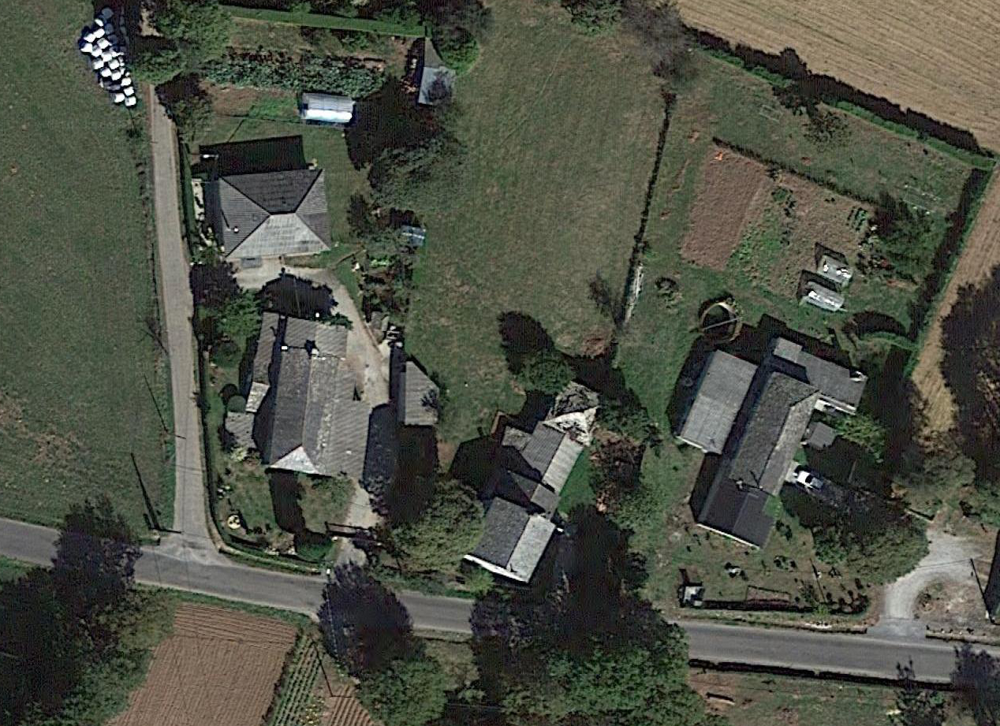
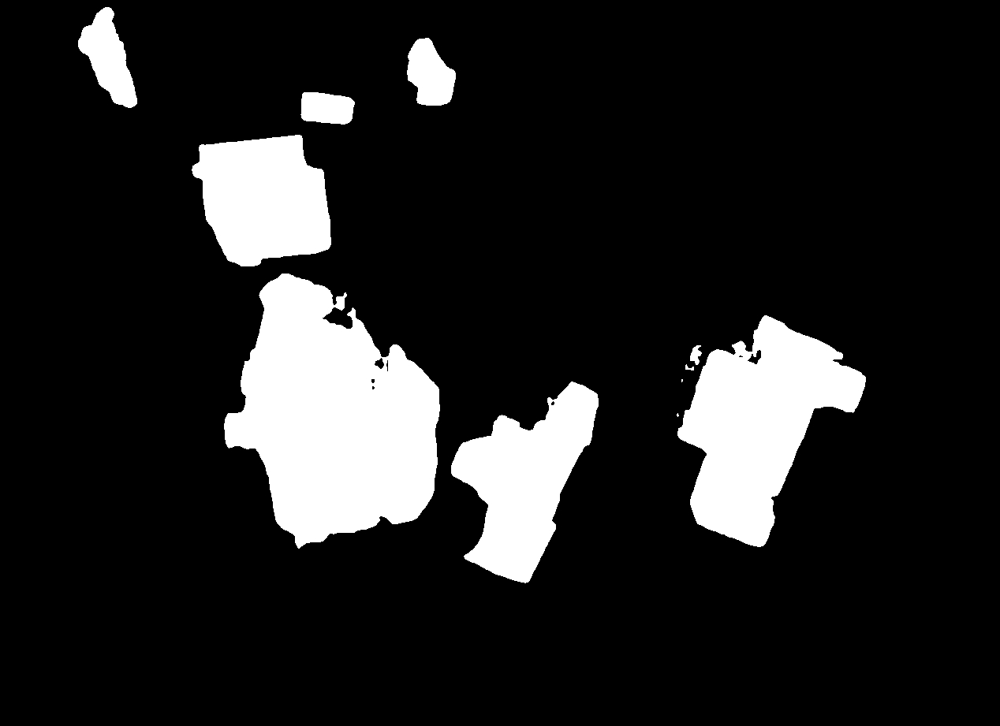

In [ ]:
archivo = "raster/text_mask.tif" #cambiar nombre para ver otra de las máscaras
leafmap.image_comparison(
    "satellite.tif",
    archivo,
    label1="Satellite Image",
    label2="Image Segmentation",
)